In [161]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import altair as alt

import folium
from folium.plugins import HeatMap
from folium.plugins import HeatMapWithTime

In [1]:
cd Desktop

/Users/connorheraty/Desktop


In [28]:
df = pd.read_csv('Crimes_-_2001_to_present.csv')

In [29]:
df = df.drop(['ID',
              'Case Number',
              'Block',
              'IUCR',
              'FBI Code',
              'Updated On',
              'Location',
              'Beat',
              'X Coordinate',
              'Y Coordinate',
              'Community Area',
              'Ward',
              'Domestic',
              'District',
              'Location Description',
              'Arrest'], axis=1)

In [30]:
df.head()

,Date,Primary Type,Description,Year,Latitude,Longitude
0,03/13/2010 10:45:00 AM,DECEPTIVE PRACTICE,THEFT OF LOST/MISLAID PROP,2010,41.781353,-87.635084
1,01/23/2007 09:30:00 PM,BATTERY,AGGRAVATED: OTHER DANG WEAPON,2007,41.877353,-87.702899
2,10/25/2006 12:53:35 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.749457,-87.685276
3,10/10/2006 06:14:41 PM,NARCOTICS,POSS: HEROIN(WHITE),2006,41.797511,-87.644022
4,01/23/2007 06:00:00 PM,THEFT,OVER $500,2007,41.783457,-87.614491


In [39]:
df_marij = df[df['Description'] == 'POSS: CANNABIS 30GMS OR LESS']

In [61]:
df_narc = df[df['Primary Type'] == 'NARCOTICS']
df_else = df_narc[df_narc['Description'] != 'POSS: CANNABIS 30GMS OR LESS']
df_else.head()

,Date,Primary Type,Description,Year,Latitude,Longitude
3,10/10/2006 06:14:41 PM,NARCOTICS,POSS: HEROIN(WHITE),2006,41.797511,-87.644022
10,01/25/2007 12:41:10 AM,NARCOTICS,POSS: CRACK,2007,41.898664,-87.746676
12,10/10/2006 07:30:00 PM,NARCOTICS,POSS: HEROIN(WHITE),2006,41.829865,-87.613418
23,11/03/2006 07:30:00 PM,NARCOTICS,SOLICIT NARCOTICS ON PUBLICWAY,2006,41.700406,-87.563196
28,10/10/2006 08:14:25 PM,NARCOTICS,POSS: CRACK,2006,41.750980,-87.590612


In [62]:
df_crack = df_else.groupby('Year')['Primary Type'].count()

In [64]:
df_crack = pd.DataFrame(df_crack)

In [43]:
df_group = df_marij.groupby('Year')['Primary Type'].count()

In [45]:
df_group = pd.DataFrame(df_group)

In [47]:
df_group = df_group.reset_index()

In [77]:
df_group = df_group.reset_index()
df_group

,level_0,index,Year,Primary Type
0,0,0,2001,14337
1,1,1,2002,15401
2,2,2,2003,17557
3,3,3,2004,18791
4,4,4,2005,19242
5,5,5,2006,20621
6,6,6,2007,23340
7,7,7,2008,20872
8,8,8,2009,21316
9,9,9,2010,22027


In [74]:
df_crack = df_crack.reset_index()
df_crack

,index,Year,Primary Type
0,0,2001,36230
1,1,2002,36388
2,2,2003,36731
3,3,2004,38269
4,4,2005,36992
5,5,2006,35192
6,6,2007,31114
7,7,2008,25635
8,8,2009,22227
9,9,2010,21366


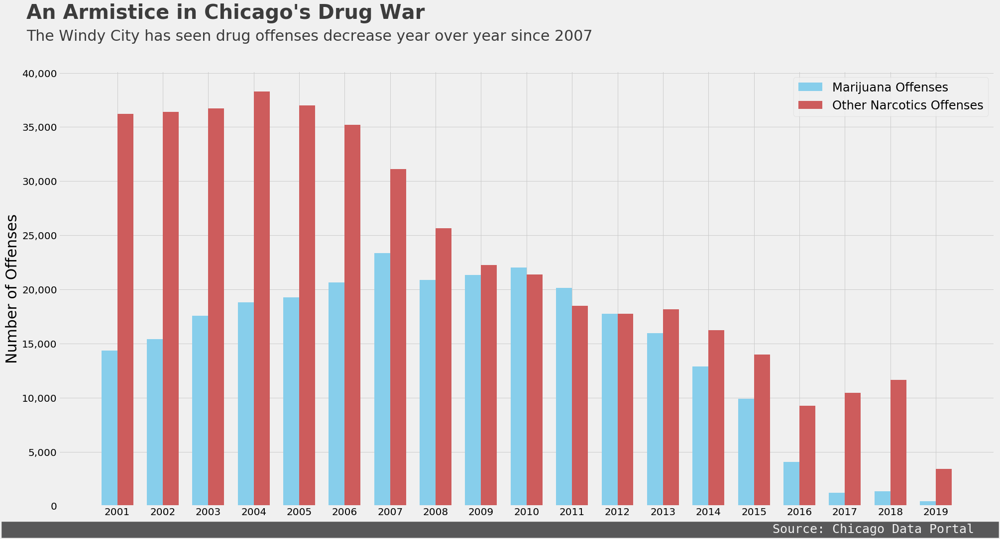

In [159]:
plt.style.use('fivethirtyeight')

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(30,15))


n_groups = 19
index = np.arange(n_groups)
width = .35

rects1 = ax.bar(index - width/2, df_group['Primary Type'], width,
               color='SkyBlue')
rects2 = ax.bar(index + width/2, df_crack['Primary Type'], width,
               color='IndianRed')


ax.set_ylabel('Number of Offenses', fontsize=30)
ax.set_yticks([0, 5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000])
ax.set_yticklabels(['0', '5,000','10,000', '15,000', '20,000', '25,000',
                    '30,000', '35,000', '40,000'],
                   fontsize=20)

ax.set_xticks(index)
ax.set_xticklabels(['2001', '2002', '2003', '2004', '2005',
                    '2006', '2007', '2008', '2009', '2010',
                    '2011', '2012', '2013', '2014', '2015',
                    '2016', '2017', '2018', '2019'], fontsize=20)

ax.legend((rects1[0], rects2[0]), ('Marijuana Offenses', 'Other Narcotics Offenses'), fontsize = 'xx-large')

ax.text(x = -2, y = 45000,
    s ="An Armistice in Chicago's Drug War",
    fontsize = 40, weight = 'bold', alpha=.75)

ax.text(x = -2, y = 43000,
    s ="The Windy City has seen drug offenses decrease year over year since 2007",
    fontsize = 30, alpha=.75)



#Add informational bar at bottom of graph
ax.text(x = -2.5, y = -2500, 
    s = '                                                                                                       Source: Chicago Data Portal   ',
    fontsize = 25, color = '#f0f0f0', backgroundcolor = '#585859', family ='monospace')

plt.show()

In [89]:
df_marij.head()

,Date,Primary Type,Description,Year,Latitude,Longitude
2,10/25/2006 12:53:35 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.749457,-87.685276
5,10/31/2006 11:33:40 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.711993,-87.638113
7,10/25/2006 01:16:33 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.706846,-87.630687
8,11/01/2006 12:13:32 AM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.965794,-87.658864
9,03/04/2006 11:33:49 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2006,41.791291,-87.665728


In [98]:
df_marij_2002 = df_marij[df_marij['Year'] == 2002]
df_marij_2018 = df_marij[df_marij['Year'] == 2018]

df_else_2002 = df_else[df_else['Year'] == 2002]
df_else_2018 = df_else[df_else['Year'] == 2018]

In [99]:
df_copy = df_else_2002.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

base_map

In [120]:
df_copy = df_else_2018.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

base_map

In [95]:
df_copy = df_marij_2002.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

base_map

In [97]:
df_copy = df_marij_2018.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

base_map

In [37]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6845673 entries, 0 to 6845672
Data columns (total 6 columns):
Date            object
Primary Type    object
Description     object
Year            int64
Latitude        float64
Longitude       float64
dtypes: float64(2), int64(1), object(3)
memory usage: 313.4+ MB


In [8]:
df_narcos = df[df['Primary Type'] == 'NARCOTICS']
df_narcos_2002 = df_narcos[df_narcos['Year'] == 2002]
df_narcos_2018 = df_narcos[df_narcos['Year'] == 2018] 

In [10]:
df_narcos_2002.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51789 entries, 39400 to 6828928
Data columns (total 22 columns):
ID                      51789 non-null int64
Case Number             51789 non-null object
Date                    51789 non-null object
Block                   51789 non-null object
IUCR                    51789 non-null object
Primary Type            51789 non-null object
Description             51789 non-null object
Location Description    51789 non-null object
Arrest                  51789 non-null bool
Domestic                51789 non-null bool
Beat                    51789 non-null int64
District                51789 non-null float64
Ward                    34914 non-null float64
Community Area          34943 non-null float64
FBI Code                51789 non-null object
X Coordinate            49824 non-null float64
Y Coordinate            49824 non-null float64
Year                    51789 non-null int64
Updated On              51789 non-null object
Latitude     

In [15]:
df_narcos_2018.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
2205571,11221928,JB139813,02/03/2018 11:52:00 AM,007XX N TRUMBULL AVE,2024,NARCOTICS,POSS: HEROIN(WHITE),SIDEWALK,True,False,...,27.0,23.0,18,1153244.0,1904783.0,2018,05/04/2018 03:51:04 PM,41.894571,-87.712629,"(41.89457135, -87.712628702)"
2205580,11221992,JB139830,02/03/2018 09:56:00 AM,001XX N LONG AVE,1822,NARCOTICS,MANU/DEL:CANNABIS OVER 10 GMS,RESIDENCE,True,False,...,28.0,25.0,18,1140317.0,1900452.0,2018,05/04/2018 03:51:04 PM,41.882933,-87.760213,"(41.88293336, -87.760212636)"
2205601,11222252,JB140271,02/03/2018 07:00:00 PM,004XX S KOSTNER AVE,2092,NARCOTICS,SOLICIT NARCOTICS ON PUBLICWAY,GAS STATION,True,False,...,24.0,26.0,18,1147128.0,1897570.0,2018,05/04/2018 03:51:04 PM,41.874897,-87.735276,"(41.874897275, -87.735275814)"
3040663,11196269,JB105663,01/05/2018 01:40:00 PM,040XX W 16TH ST,2024,NARCOTICS,POSS: HEROIN(WHITE),SIDEWALK,True,False,...,24.0,29.0,18,1149897.0,1891748.0,2018,05/04/2018 03:51:04 PM,41.858868,-87.725261,"(41.85886763, -87.725260526)"
3046205,11204631,JB116926,01/15/2018 01:22:00 PM,056XX S BISHOP ST,2027,NARCOTICS,POSS: CRACK,STREET,True,False,...,16.0,67.0,18,1167625.0,1867441.0,2018,05/04/2018 03:51:04 PM,41.791804,-87.660885,"(41.791803761, -87.66088535)"


In [12]:
def generateBaseMap(default_location=[41.896494, -87.690561], default_zoom_start=12):
    base_map = folium.Map(location = default_location, control_scale=True, zoom_start= default_zoom_start)
    return base_map

In [51]:
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)

In [52]:
base_map

In [56]:
from folium.plugins import HeatMap
df_copy = df_narcos_2018.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

In [57]:
base_map

In [59]:
df_copy = df_narcos_2002.copy()
df_copy['count'] = 1
base_map = generateBaseMap()
folium.TileLayer('cartodbpositron').add_to(base_map)
HeatMap(data=df_copy[['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist(),
       radius=8, max_zoom=13).add_to(base_map)

base_map

In [ ]:
df_hour_list = []

for hour in df_copy.

In [21]:
df_copy.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,count
39400,1938240,HH115954,01/09/2002 03:00:00 PM,111XX S EDBROOKE AV,2027,NARCOTICS,POSS: CRACK,STREET,True,False,...,NaN,18,1179179.0,1831194.0,2002,02/28/2018 03:56:25 PM,41.692082,-87.619621,"(41.692081893, -87.619621487)",1
39706,1938248,HH115783,01/09/2002 01:30:00 PM,059XX S ROCKWELL ST,2027,NARCOTICS,POSS: CRACK,STREET,True,False,...,NaN,18,1160057.0,1865177.0,2002,02/28/2018 03:56:25 PM,41.785750,-87.688698,"(41.785750126, -87.68869821)",1
40165,1938265,HH116131,01/09/2002 04:33:00 PM,016XX N MASON AV,1811,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,SIDEWALK,True,False,...,NaN,18,1136503.0,1910226.0,2002,02/28/2018 03:56:25 PM,41.909823,-87.773984,"(41.909823499, -87.773984044)",1
40550,1938287,HH116780,01/09/2002 10:15:00 PM,035XX N NARRAGANSETT AV,1811,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,STREET,True,False,...,NaN,18,1133071.0,1922680.0,2002,02/28/2018 03:56:25 PM,41.944059,-87.786300,"(41.944059468, -87.786300133)",1
41064,1938299,HH116513,01/09/2002 07:35:00 PM,050XX N CLARK ST,1811,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,STREET,True,False,...,NaN,18,1165179.0,1933411.0,2002,02/28/2018 03:56:25 PM,41.972883,-87.667979,"(41.97288286, -87.667978956)",1


In [ ]:
time_df = df_narc['Date'].apply(lambda x: pd.Series(x.split(' ')))
time_df = time_df.rename({0: 'MMDDYYYY', 1: 'Time', 2: 'AM/PM'}, axis=1)
time_df = time_df.reset_index()

In [121]:
df_narc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 716665 entries, 2 to 6845670
Data columns (total 6 columns):
Date            716665 non-null object
Primary Type    716665 non-null object
Description     716665 non-null object
Year            716665 non-null int64
Latitude        707118 non-null float64
Longitude       707118 non-null float64
dtypes: float64(2), int64(1), object(3)
memory usage: 38.3+ MB


In [122]:
df_narc[["MMDDYYYY", "Time", "AM/PM"]] = df_narc['Date'].apply(lambda x: pd.Series(x.split(' ')))

KeyboardInterrupt: 

In [123]:
df_narc_2002 = df_narc[df_narc['Year'] == 2002]

In [125]:
df_narc_2002[["MMDDYYYY", "Time", "AM/PM"]] = df_narc_2002['Date'].apply(lambda x: pd.Series(x.split(' ')))

/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3140: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self[k1] = value[k2]


In [126]:
df_narc_2002.head()

,Date,Primary Type,Description,Year,Latitude,Longitude,MMDDYYYY,Time,AM/PM
39400,01/09/2002 03:00:00 PM,NARCOTICS,POSS: CRACK,2002,41.692082,-87.619621,01/09/2002,03:00:00,PM
39706,01/09/2002 01:30:00 PM,NARCOTICS,POSS: CRACK,2002,41.785750,-87.688698,01/09/2002,01:30:00,PM
40165,01/09/2002 04:33:00 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2002,41.909823,-87.773984,01/09/2002,04:33:00,PM
40550,01/09/2002 10:15:00 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2002,41.944059,-87.786300,01/09/2002,10:15:00,PM
41064,01/09/2002 07:35:00 PM,NARCOTICS,POSS: CANNABIS 30GMS OR LESS,2002,41.972883,-87.667979,01/09/2002,07:35:00,PM


In [162]:
df_test = df_narc_2002.Time

In [167]:
num = df_test.head(1) + df_test.head(2)

In [168]:
num

39400    03:00:0003:00:00
39706                 NaN
Name: Time, dtype: object

In [160]:
df_narc_2002.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 51789 entries, 39400 to 6828928
Data columns (total 10 columns):
Date            51789 non-null object
Primary Type    51789 non-null object
Description     51789 non-null object
Year            51789 non-null int64
Latitude        49824 non-null float64
Longitude       49824 non-null float64
MMDDYYYY        51789 non-null object
Time            51789 non-null object
AM/PM           51789 non-null object
count           51789 non-null int64
dtypes: float64(2), int64(2), object(6)
memory usage: 4.3+ MB


In [130]:
df_hour_list = []
df_narc_2002['count'] = 1

for Time in df_narc_2002.Time.sort_values().unique():
    df_hour_list.append(df_narc_2002.loc[df_narc_2002.Time == Time, ['Latitude', 'Longitude', 'count']].groupby(['Latitude', 'Longitude']).sum().reset_index().values.tolist())


/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [133]:
df_hour_list

[[[41.656517674, -87.60513167399999, 1.0],
  [41.65736912, -87.591933595, 1.0],
  [41.670004100999996, -87.63804156799999, 1.0],
  [41.671813603000004, -87.647798556, 1.0],
  [41.674857888000005, -87.62041577, 1.0],
  [41.677023715, -87.63345259799999, 1.0],
  [41.677873345, -87.63643041600001, 1.0],
  [41.67895872, -87.62631903100001, 1.0],
  [41.681103406, -87.632365079, 1.0],
  [41.682182925, -87.62402867799999, 1.0],
  [41.682536387, -87.623493976, 1.0],
  [41.685883509, -87.664039619, 1.0],
  [41.686408518, -87.65435801299999, 1.0],
  [41.688551379, -87.613253462, 1.0],
  [41.69017063, -87.635060197, 1.0],
  [41.695277592, -87.62649184700001, 1.0],
  [41.695916265, -87.63039543200001, 1.0],
  [41.698929185, -87.61965197200001, 1.0],
  [41.699634246, -87.607347854, 1.0],
  [41.701623299999994, -87.62930794299999, 1.0],
  [41.70176649, -87.56512026600001, 1.0],
  [41.702459626, -87.62695882700001, 1.0],
  [41.704110064, -87.536495442, 1.0],
  [41.705712736, -87.536493963, 1.0],
  [4

In [132]:
from folium.plugins import HeatMapWithTime
HeatMapWithTime(df_hour_list, radius=5, gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'}, min_opacity=0.5, max_opacity=0.8, use_local_extrema=True).add_to(base_map)
base_map